In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise

def add_gaussian_noise(image, mean=0, var=0.01):
    noisy = cv2.GaussianBlur(image, (7, 7), 5)
    return np.clip(noisy, 0, 255).astype('uint8')

def add_salt_and_pepper_noise(image, amount=0.05, salt_vs_pepper=0.5):
    noisy = random_noise(image, mode='s&p', amount=amount, salt_vs_pepper=salt_vs_pepper)
    return (255 * noisy).astype('uint8')

def add_poisson_noise(image):
    noisy = random_noise(image, mode='poisson')
    return (255 * noisy).astype('uint8')

def add_speckle_noise(image):
    noisy = random_noise(image, mode='speckle')
    return (255 * noisy).astype('uint8')

def apply_noise_and_display(image_dir, filter1):
    # Get list of images in the directory
    images = [x for x in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, x))]

    plt.figure(figsize=(20, len(images) * 5))

    for idx, image_name in enumerate(images):
        # Load the image
        image_path = os.path.join(image_dir, image_name)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Plot original image
        plt.subplot(len(images), 2, idx * 2 + 1)
        plt.imshow(image_rgb)
        plt.title(f'Original Image {idx + 1}')
        plt.axis('off')

        # Apply Gaussian noise and plot
        noisy_image = filter1(image_rgb)
        plt.subplot(len(images), 2, idx * 2 + 2)
        plt.imshow(noisy_image)
        plt.title(f'Gaussian Noise {idx + 1}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


E:\anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


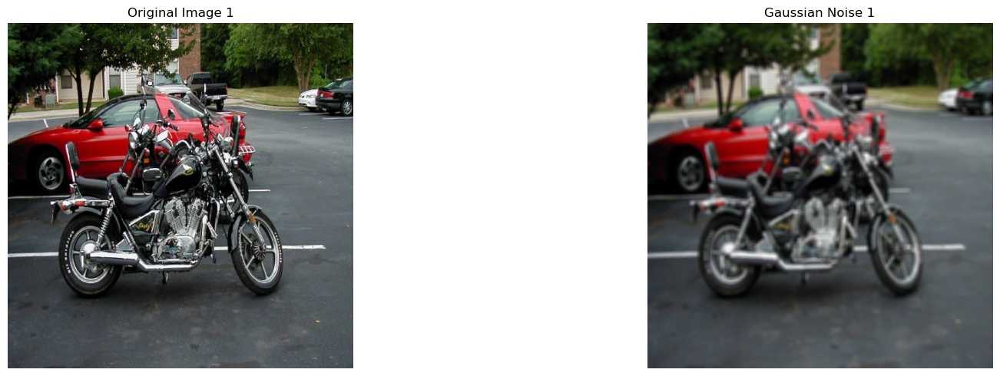

In [2]:

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/non_noise_pics'

# Apply noise and display images
apply_noise_and_display(image_dir, add_gaussian_noise)


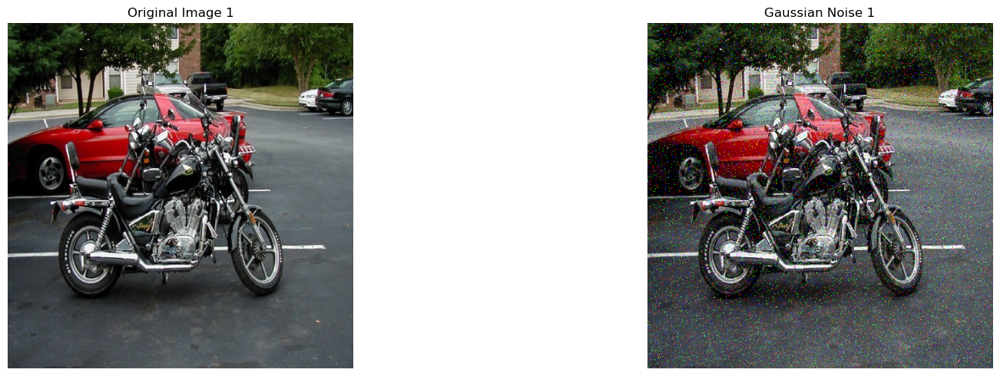

In [3]:

def add_salt_and_pepper_noise(image, amount=0.05, salt_vs_pepper=0.5):
    noisy = random_noise(image, mode='s&p', amount=amount, salt_vs_pepper=salt_vs_pepper)
    return (255 * noisy).astype('uint8')

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/non_noise_pics'

# Apply noise and display images
apply_noise_and_display(image_dir, add_salt_and_pepper_noise)


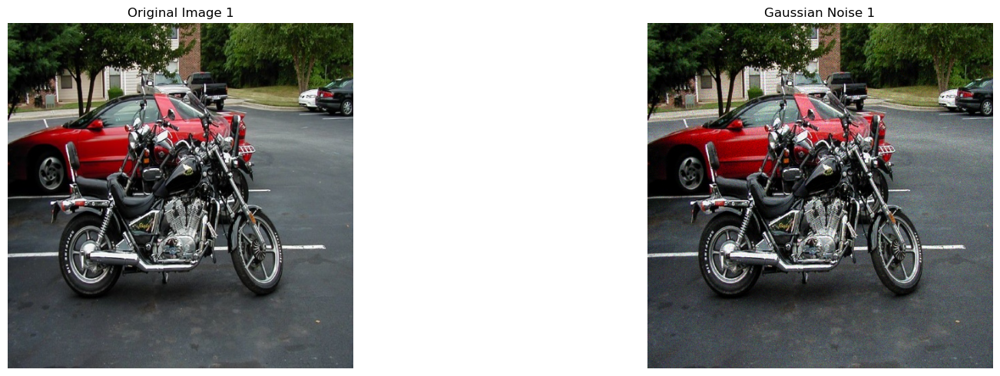

In [4]:
def add_poisson_noise(image):
    noisy = random_noise(image, mode='poisson')
    return (255*noisy).astype('uint8')

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/non_noise_pics'

# Apply noise and display images
apply_noise_and_display(image_dir, add_poisson_noise)


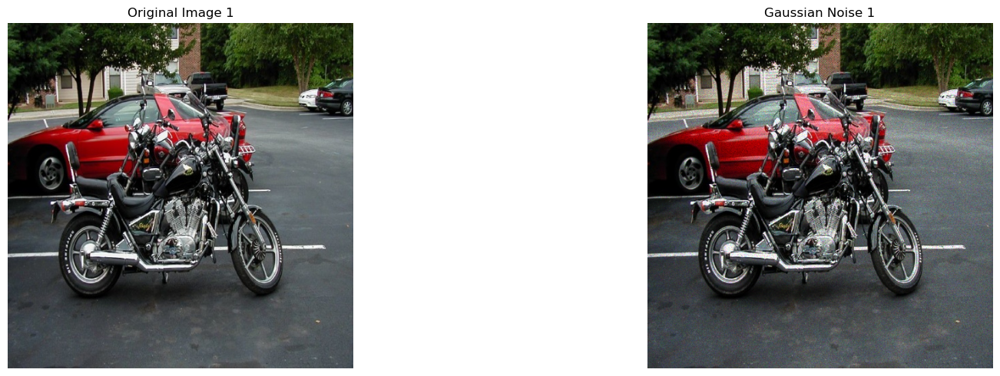

In [5]:
def add_speckle_noise(image):
    noisy = random_noise(image, mode='speckle')
    return (255*noisy).astype('uint8')

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/non_noise_pics'

# Apply noise and display images
apply_noise_and_display(image_dir, add_speckle_noise)


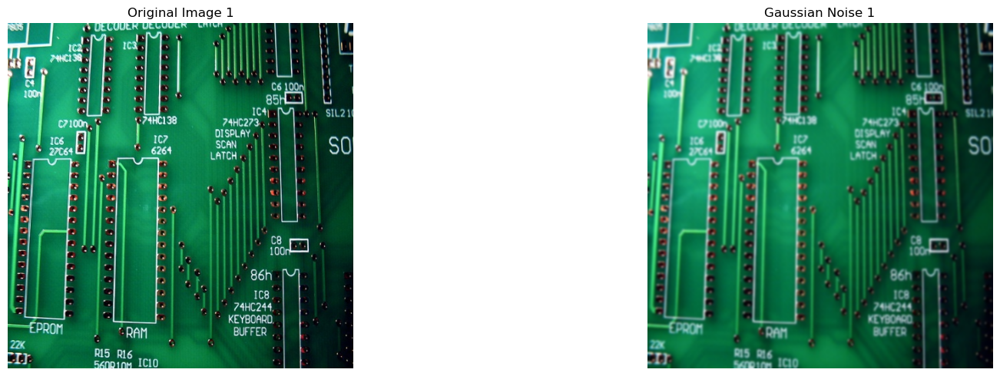

In [6]:
#This noise appears as a uniform grainy texture across the image.
#It is more prominent in smooth areas and less noticeable in areas with high texture.
def remove_gaussian_noise(image):
    return cv2.GaussianBlur(image, (7, 7), 0)

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/noise/gauss'

# Apply noise and display images
apply_noise_and_display(image_dir, remove_gaussian_noise)

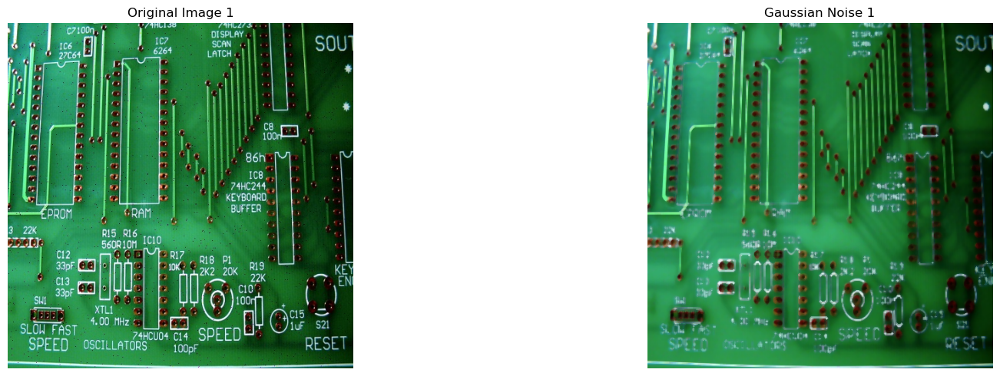

In [7]:
#This noise appears as black and white dots scattered randomly throughout the image.
def remove_salt_and_pepper_noise(image):
    return cv2.medianBlur(image, 5)

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/noise/salt_and_paper'

# Apply noise and display images
apply_noise_and_display(image_dir, remove_salt_and_pepper_noise)

Normal shape: (512, 512, 3)
Linear Interpolation shape: (77, 77, 3)
Cubic Interpolation shape: (1024, 1024, 3)
Area Interpolation shape: (1024, 1024, 3)


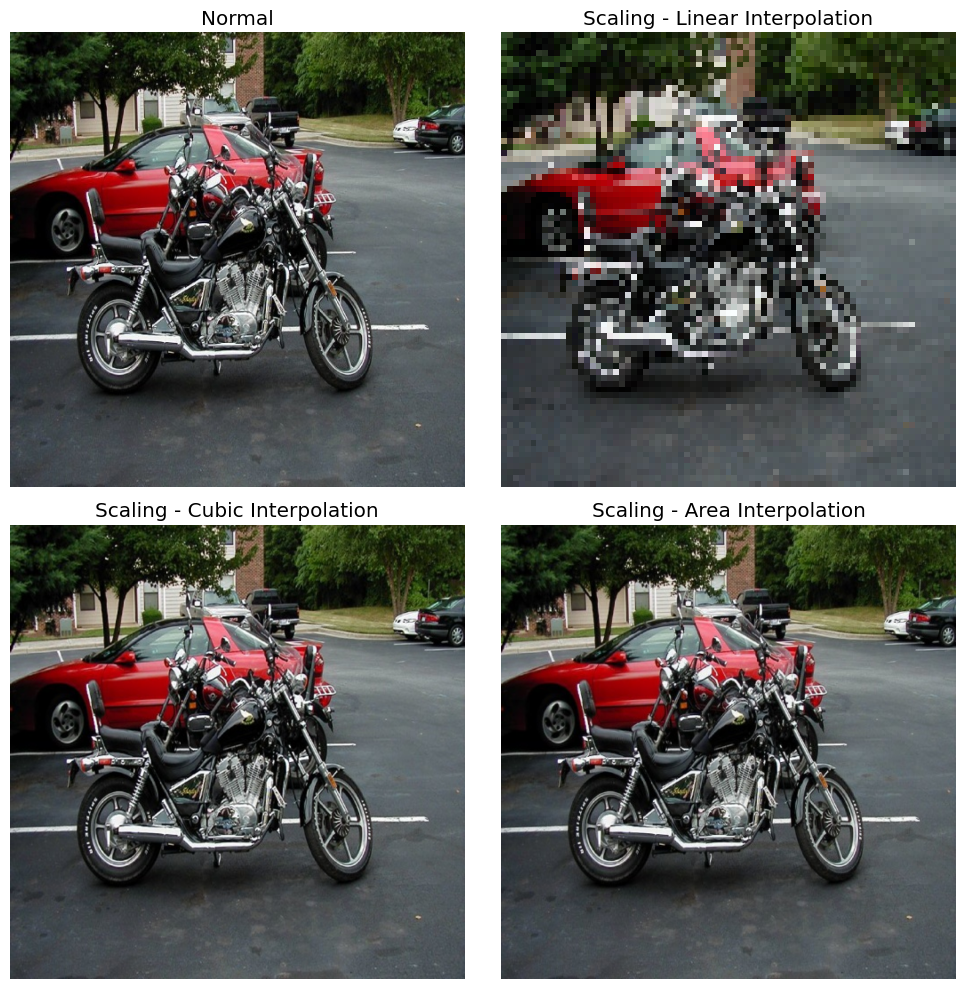

In [34]:
plt.figure(figsize=(10, 10))

# Normal Image
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Normal')
print(f'Normal shape: {image.shape}')




# Let's make our image 3/4 of it's original size
plt.subplot(2, 2, 2)
image_scaled = cv2.resize(image, None, fx=0.15, fy=0.15, interpolation = cv2.INTER_LINEAR)
plt.imshow(cv2.cvtColor(image_scaled, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Scaling - Linear Interpolation')
print(f'Linear Interpolation shape: {image_scaled.shape}')








# Let's double the size of our image
plt.subplot(2, 2, 3)
img_scaled_v1 = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
plt.imshow(cv2.cvtColor(img_scaled_v1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Scaling - Cubic Interpolation')
print(f'Cubic Interpolation shape: {img_scaled_v1.shape}')




# Let's double the size of our image
plt.subplot(2, 2, 4)
img_scaled_v2 = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_AREA)
plt.imshow(cv2.cvtColor(img_scaled_v2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Scaling - Area Interpolation')
print(f'Area Interpolation shape: {img_scaled_v2.shape}')

plt.tight_layout()
plt.show()

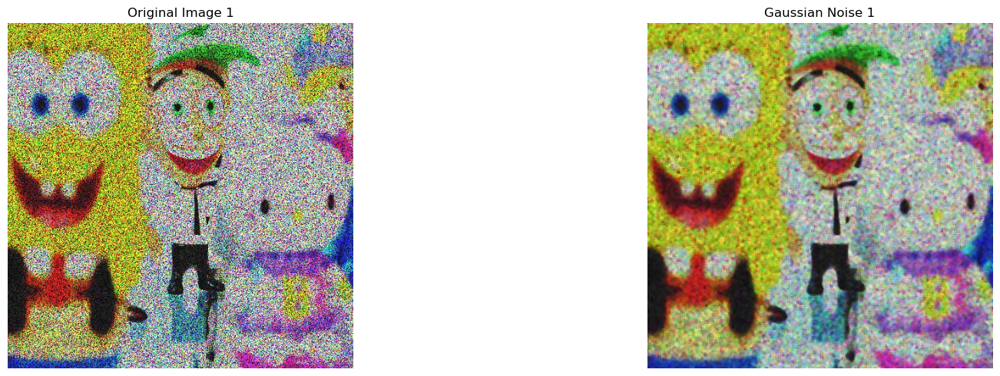

In [9]:
#This noise appears as a multiplicative granular pattern, which can significantly affect the visual quality of the image.

def remove_speckle_noise(image):
    return cv2.medianBlur(image, 5)

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/noise/speckle'

# Apply noise and display images
apply_noise_and_display(image_dir, remove_speckle_noise)

In [10]:
import pandas as pd
import numpy as np

from glob import glob

import cv2
import matplotlib.pylab as plt

plt.style.use('ggplot')

In [11]:
img_mpl = plt.imread(r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/non_noise_pics/101511983_dd16e3a5f6_c.jpg') # Access the first (and only) element in the list
img_cv2 = cv2.imread(r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/non_noise_pics/101511983_dd16e3a5f6_c.jpg')
img_mpl.shape, img_cv2.shape

((512, 512, 3), (512, 512, 3))

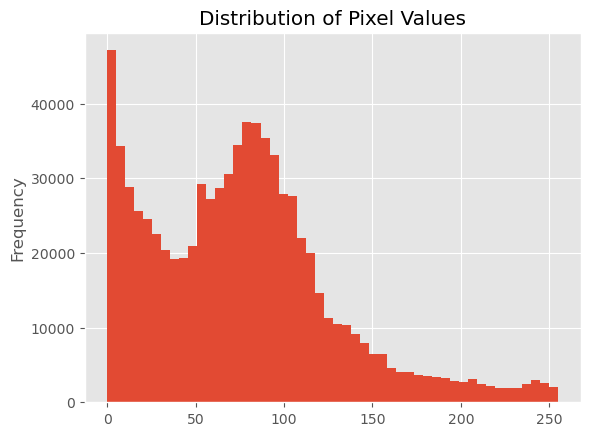

In [12]:
pd.Series(img_mpl.flatten()).plot(kind='hist',
                                  bins=50,
                                  title='Distribution of Pixel Values')
plt.show()

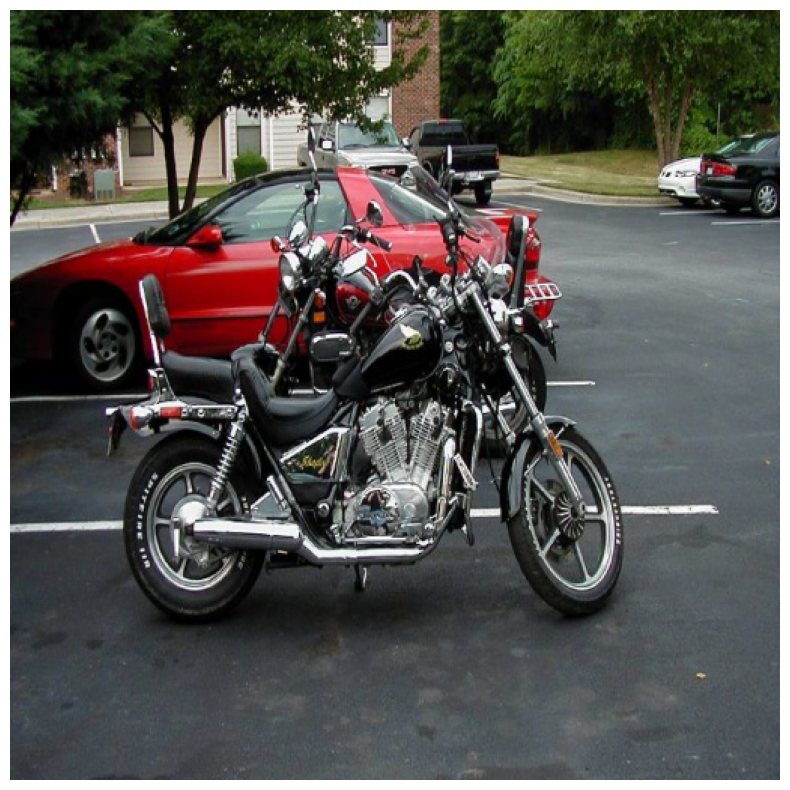

In [13]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img_mpl)
ax.axis('off')
plt.show()

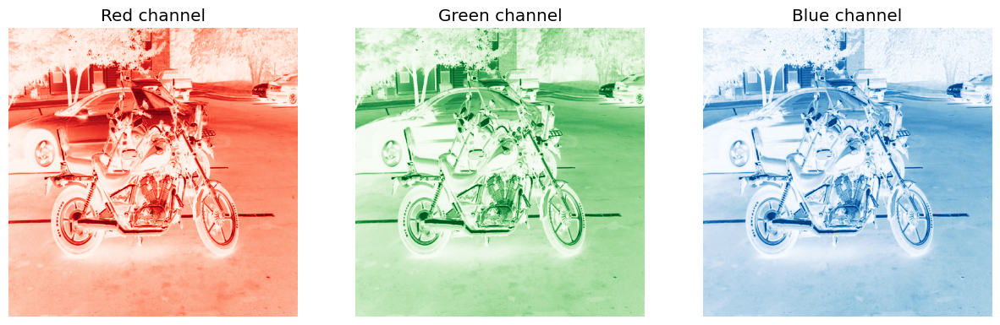

In [14]:
# Display RGB Channels of our image
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img_mpl[:,:,0], cmap='Reds')
axs[1].imshow(img_mpl[:,:,1], cmap='Greens')
axs[2].imshow(img_mpl[:,:,2], cmap='Blues')
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[0].set_title('Red channel')
axs[1].set_title('Green channel')
axs[2].set_title('Blue channel')
plt.show()

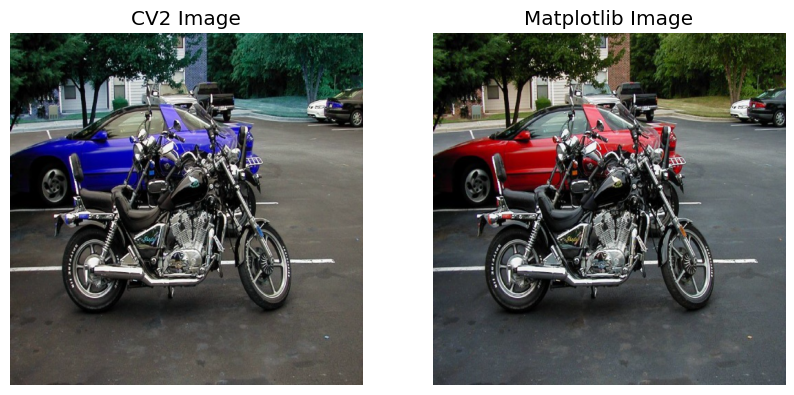

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_cv2)
axs[1].imshow(img_mpl)
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('CV2 Image')
axs[1].set_title('Matplotlib Image')
plt.show()

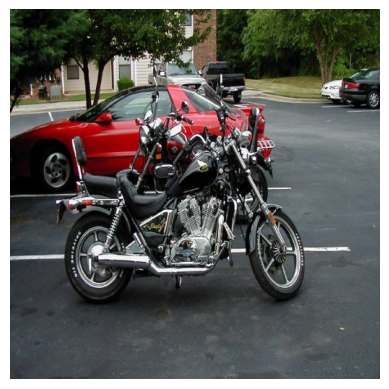

In [16]:
# Converting from BGR to RGB
img_cv2_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots()
ax.imshow(img_cv2_rgb)
ax.axis('off')
plt.show()

512 512


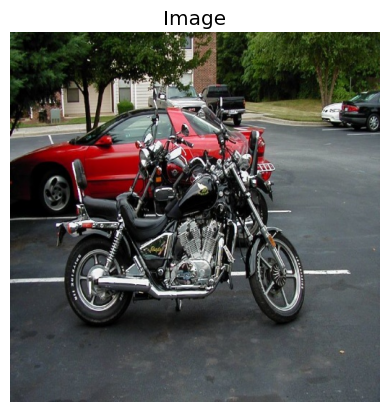

In [17]:
image = img_cv2
height, width = image.shape[:2]
print(height, width)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Image')


plt.show()

In [18]:

# Divide by two to rototate the image around its centre
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 90, 0.5)
# Affine Transformations
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))

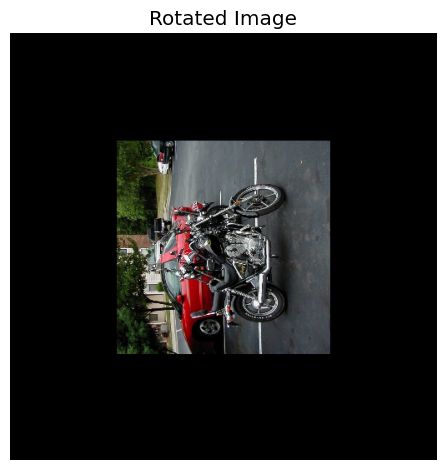

In [19]:
plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Rotated Image')

plt.tight_layout()
plt.show()

In [20]:
height, width

(512, 512)

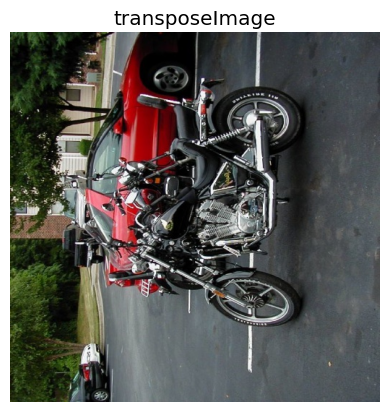

In [21]:
#rotation changes the orientation of the image, while transposition swaps rows with columns.
imagetranspose = cv2.transpose(image)

plt.imshow(cv2.cvtColor(imagetranspose, cv2.COLOR_BGR2RGB))
plt.title('transposeImage')
plt.axis('off')

plt.show()

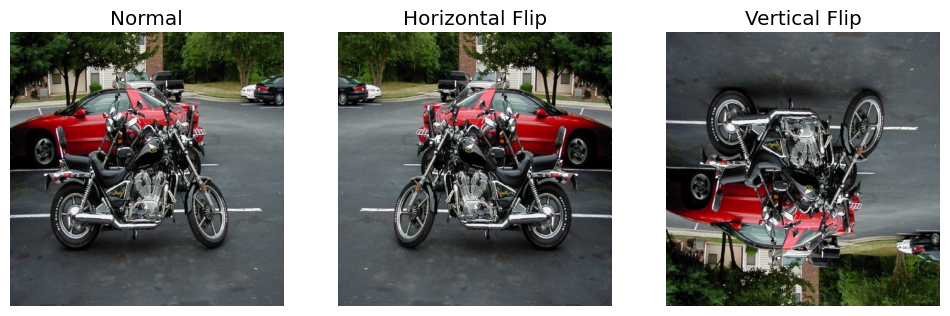

In [22]:
plt.figure(figsize= (12, 8))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Normal')



plt.subplot(1, 3, 2)
hflip_img = cv2.flip(image, 1)
plt.imshow(cv2.cvtColor(hflip_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Horizontal Flip')



plt.subplot(1, 3, 3)
vflip_img = cv2.flip(image, 0)
plt.imshow(cv2.cvtColor(vflip_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Vertical Flip')

plt.show()

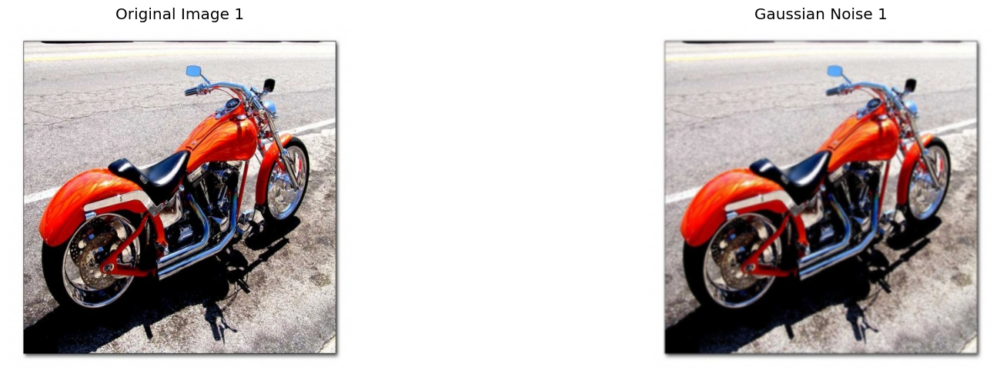

In [23]:
#This noise appears as a grainy pattern, similar to Gaussian noise but with different statistical properties.
def remove_poisson_noise(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

# Directory containing images
image_dir = r'C:/Users/Ziad Sameh/Desktop/DEPI/New folder/validate/noise/poison'

# Apply noise and display images
apply_noise_and_display(image_dir, remove_poisson_noise)

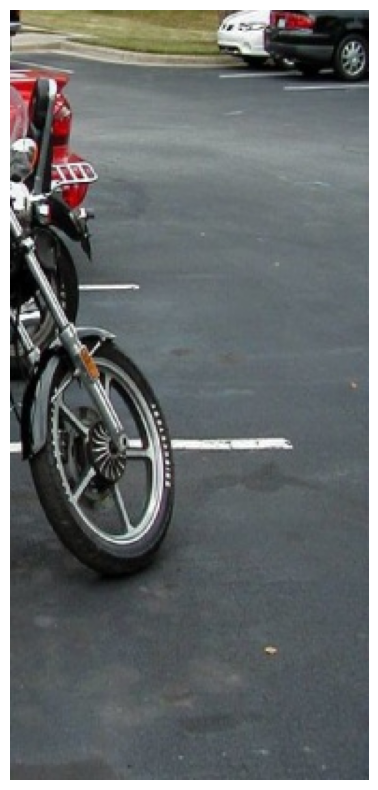

In [24]:
#Cropping

height, width = image.shape[:2]
s_row, s_col = 100, 320
e_row, e_col = height, width
crop_img = image[s_row:e_row, s_col:e_col]



plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

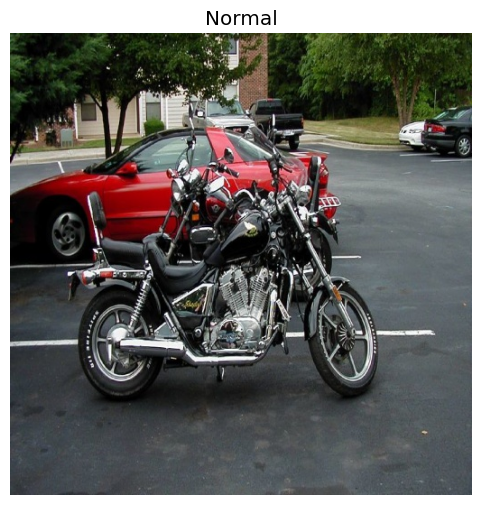

In [25]:
#5. Bluring¶
#Convolutions Bluring / Averaging Bluring / Box Blurring





image = img_cv2

# Normal Image
plt.figure(figsize=(6, 6))

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Normal')
plt.show()

In [26]:
kernel_3x3 = np.ones((3, 3), np.float32) / 9
kernel_7x7 = np.ones((7, 7), np.float32) / 49

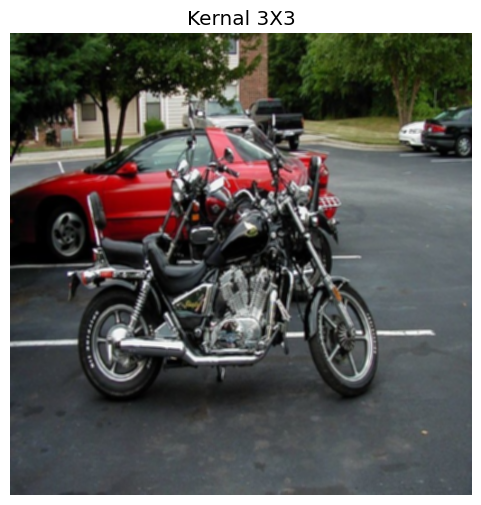

In [27]:
# Kernel with 3x3
plt.figure(figsize=(6, 6))

blur3_img = cv2.filter2D(image, -1, kernel_3x3)
#blur3_img = cv2.blur(image, (3, 3))
plt.imshow(cv2.cvtColor(blur3_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Kernal 3X3')
plt.show()

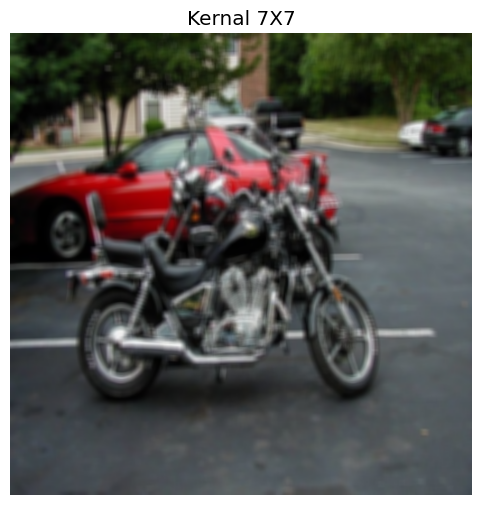

In [28]:
# Kernel with 7x7
plt.figure(figsize=(6, 6))

blur7_img = cv2.filter2D(image, -1, kernel_7x7)
#blur7_img = cv2.blur(image, (7, 7))
plt.imshow(cv2.cvtColor(blur7_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Kernal 7X7')
plt.show()

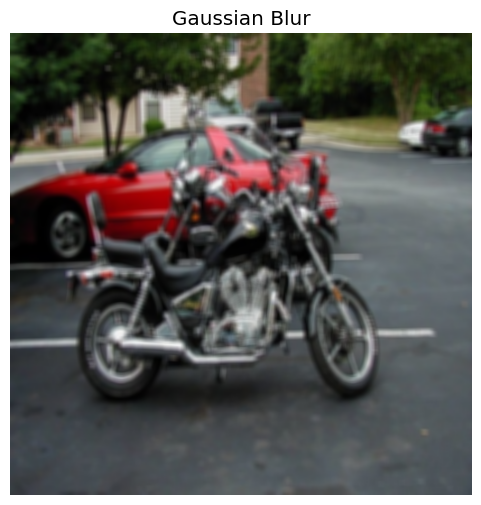

In [29]:
# Gaussian with 7x7
plt.figure(figsize=(6, 6))

Gaussian = cv2.GaussianBlur(image, (7,7), 5)
plt.imshow(cv2.cvtColor(Gaussian, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Gaussian Blur')
plt.show()

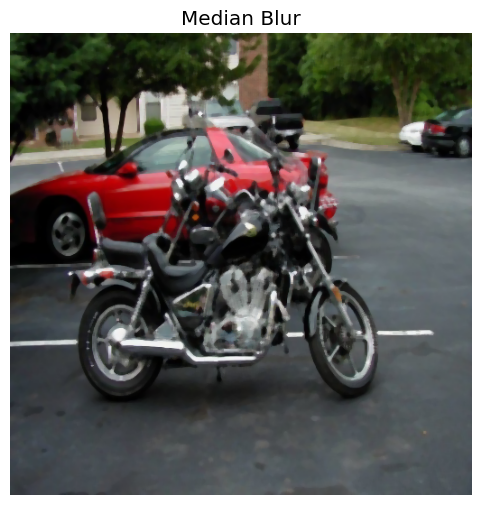

In [30]:
# Median with 7x7
# Takes median of all the pixels under kernel area and central element is replaced with this median value.
plt.figure(figsize=(6, 6))

Median = cv2.medianBlur(image, 5)
plt.imshow(cv2.cvtColor(Median, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Median Blur')
plt.show()

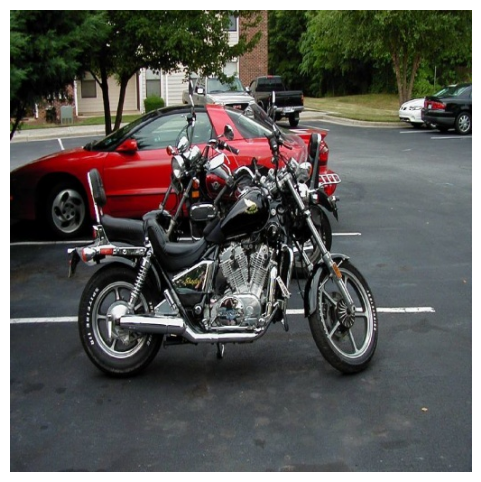

In [31]:
# Normal Image
image = img_cv2
plt.figure(figsize=(6, 6))

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

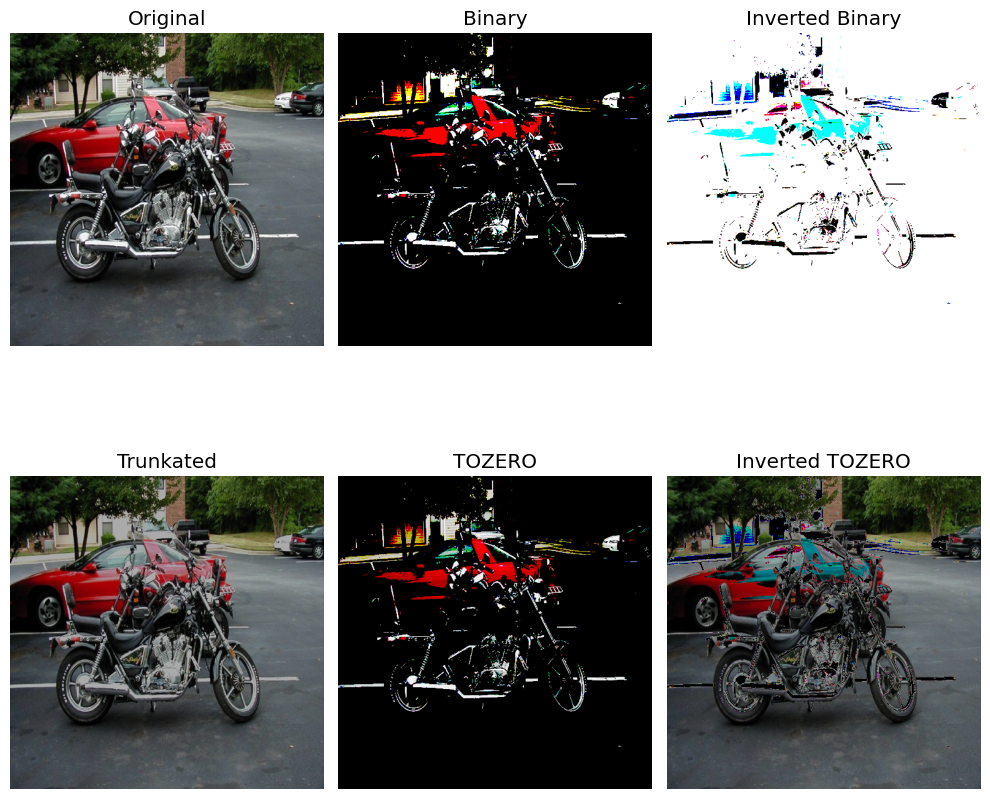

In [32]:
plt.figure(figsize=(10, 10))
# Normal Image
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')
# Binary Threshold
plt.subplot(2, 3, 2)
ret1, thresh1 = cv2.threshold(image, 170, 255, cv2.THRESH_BINARY)
# Pixels with intensities greater than the threshold are set to a maximum value (maxval 255),
# and those less than or equal to the threshold are set to zero.
plt.imshow(cv2.cvtColor(thresh1, cv2.COLOR_BGR2RGB))
plt.title('Binary')
plt.axis('off')
# Inverted Binary Threshold
plt.subplot(2, 3, 3)
ret2, thresh2 = cv2.threshold(image, 170, 255, cv2.THRESH_BINARY_INV)
# Inverse of binary thresholding. Pixels with intensities greater than the threshold are set to zero,
# and those less than or equal to the threshold are set to a maximum value (maxval).
plt.imshow(cv2.cvtColor(thresh2, cv2.COLOR_BGR2RGB))
plt.title('Inverted Binary')
plt.axis('off')
# Trunkated Threshold
plt.subplot(2, 3, 4)
ret3, thresh3 = cv2.threshold(image, 170, 255, cv2.THRESH_TRUNC)
# Pixels with intensities greater than the threshold are set to the threshold value,
# and those less than or equal to the threshold remain unchanged.
plt.imshow(cv2.cvtColor(thresh3, cv2.COLOR_BGR2RGB))
plt.title('Trunkated')
plt.axis('off')
# To Zero Threshold
plt.subplot(2, 3, 5)
ret4, thresh4 = cv2.threshold(image, 170, 225, cv2.THRESH_TOZERO)
# Pixels with intensities greater than the threshold remain unchanged,
# and those less than or equal to the threshold are set to zero.
plt.imshow(cv2.cvtColor(thresh4, cv2.COLOR_BGR2RGB))
plt.title('TOZERO')
plt.axis('off')
# Inverted To Zero Threshold
plt.subplot(2, 3, 6)
ret5, thresh5 = cv2.threshold(image, 170, 225, cv2.THRESH_TOZERO_INV)
# Inverse of To Zero Thresholding. Pixels with intensities greater than the threshold are set to zero,
# and those less than or equal to the threshold remain unchanged.
plt.imshow(cv2.cvtColor(thresh5, cv2.COLOR_BGR2RGB))
plt.title('Inverted TOZERO')
plt.axis('off')

plt.tight_layout()
plt.show()



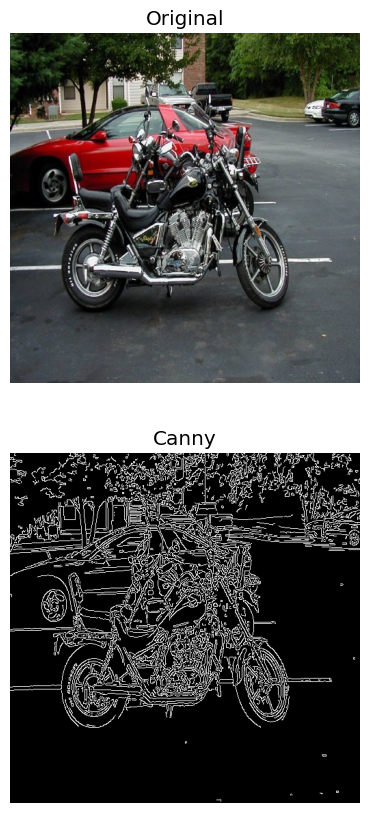

In [33]:
image = img_cv2

plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(2, 1, 2)
canny = cv2.Canny(image, 100, 200)
plt.imshow(cv2.cvtColor(canny, cv2.COLOR_BGR2RGB))
plt.title('Canny')
plt.axis('off')

plt.show()